# Blade perturbation

This notebook demonstrates the blade perturbation capability of [G2Aero](https://github.com/NREL/G2Aero). The script version can be found in `examples/perturb_blade.py`.

In [1]:
import os
import numpy as np
# G2Aero
from g2aero.PGA import PGAspace
from g2aero.utils import position_airfoil
from g2aero.yaml_info import YamlInfo
from g2aero.Grassmann_interpolation import GrassmannInterpolator
from g2aero.transform import TransformBlade, global_blade_coordinates
from g2aero.SPD import polar_decomposition
# Plotting
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

## Define Data-Driven Domain of shapes
We begin by loading the dataset of airfoils from the file and construct a 4-dimensional PGA space by setting `n_modes=4`(in general, `n_modes` can be any number less then 2*n_landmarks). See [Defining a Data-Driven Domain of Shapes](https://g2aero.readthedocs.io/en/latest/how_to_guides/files/0_Data-Driven_Domain.html#) for more details.

In [2]:
# Load shapes from the dataset
shapes_file = os.path.join(os.getcwd(), '../../data/airfoils', 'CST_shapes_TE_gap.npz')
shapes = np.load(shapes_file)['shapes']
n_landmarks = shapes.shape[1]

#### PGA space
pga, t = PGAspace.create_from_dataset(shapes, n_modes=4)
pga.radius /= 2  #set sampling radius

Karcher mean convergence:
||V||_F = 0.10235806971182138
||V||_F = 0.00015526889897758003
||V||_F = 2.7114758181406616e-07
||V||_F = 5.985411586299064e-10


### Load PGA space

Alternatively, we can use parameter space (PGA space) constracted previously (see [Defining a Data-Driven Domain of Shapes](https://g2aero.readthedocs.io/en/latest/how_to_guides/files/0_Data-Driven_Domain.html) for more details about used dataset and how to construct PGA space). To visualize this parameter space we plot a scatterplot showing data points representing airfoils from database.

In [3]:
# pga_dict = np.load(os.path.join(os.getcwd(), '../../data/PGA_space/PGA_space.npz'))
# pga = PGAspace(pga_dict['Vh'], pga_dict['M_mean'], pga_dict['b_mean'], pga_dict['karcher_mean'])
# t = np.load(os.path.join(os.getcwd(), '../../data/PGA_space', 't.npz'))['t']
# # for sampling 
# pga.axis_min, pga.axis_max = np.min(t, axis=0),  np.max(t, axis=0)
# r_min, r_max = np.abs(np.quantile(t, 0.0, axis=0)), np.abs(np.quantile(t, 0.0, axis=0))
# pga.radius = np.max(np.array([r_min, r_max]), axis=0)

## Load blade definition from .yaml file
Note, we use only cross-sections starting from the third `Blade.xy_landmarks[2:]` (the first cross-sections in a blade definition are hub circles and we don't want to perturb them). 

In [4]:
blade_filename = 'IEA-15-240-RWT.yaml' # or 'nrel5mw_ofpolars.yaml'
shapes_path = os.path.join(os.getcwd(), '../../data/blades_yamls', blade_filename)

Blade = YamlInfo(shapes_path, n_landmarks=n_landmarks, landmark_method='cst')
M_yaml = Blade.M_yaml_interpolator
b_yaml = Blade.b_yaml_interpolator
b_pitch = Blade.pitch_axis

shapes_bs = Blade.xy_landmarks[2:] # given (baseline) blade airfoils

# Uncomment if dataset doesn't have TE gaps
# # remove gap from nominal shapes
# shapes_bs = np.empty_like(Blade.xy_landmarks)
# for i, xy in enumerate(Blade.xy_landmarks):
#     nogap_shapes[i] = remove_tailedge_gap(xy)

## Generate perturbation
First we need to get LA-standardized shapes for baseline blade airfoils

In [5]:
shapes_gr_bs, M_bs, b_bs = polar_decomposition(shapes_bs)

Now we can use these standardized shapes to generate perturbations. As an example, let's generate `N=2` total perturbations. 

The method generates a pertubation vector `coef` and consistently perturbs each cross-section of the blade using parallel transport. The returned arrays `new_shapes` and `coef` have shapes (N, n_shapes_in_blade, n_landmarks, 2) and (N, n_modes), respectively. 

Note, that the pertubation vector is generated randomly and can perturb blade in a manner where some of perturbed cross-sections would self-intersect. If this happens, a new perturbation vecor is automatically generated and blade subsequently perturbed using the new `coef`.

In [6]:
N = 2
new_blades, coef = pga.generate_perturbed_blade(shapes_gr_bs, n=N)
print(f'\nnew_blades shape: {new_blades.shape}')
print(f'coef shape: {coef.shape}')

Perturbing blade 1
Perturbing blade 2

new_blades shape: (2, 8, 401, 2)
coef shape: (2, 4)


To visualize the consistent perturbation to the blade and augment the human interpretable notion of consistency, we plot the nominal (baseline) airfoils compared to the consistently perturbed cross-sections. Notice that although the airfoils are distinct, they are deformed in a markedly similar manner.

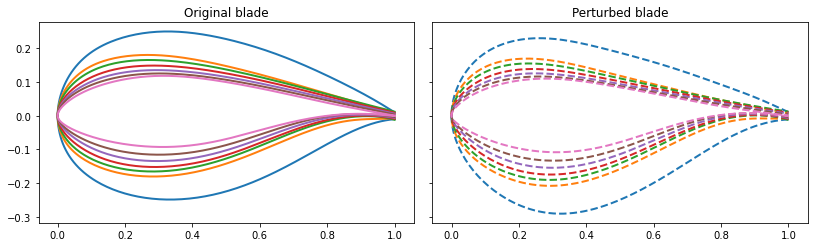

In [7]:
fig, ax = plt.subplots(1, 2, figsize=(12, 3.2), sharey='row')
for i, (shape, new, m) in enumerate(zip(shapes_gr_bs[:-1], new_blades[0, :-1], M_bs[:-1])):
    old_phys = position_airfoil(shape@m)
    new_phys = position_airfoil(new@m)
    ax[0].plot(old_phys[:, 0], old_phys[:, 1], lw=2); 
    ax[1].plot(new_phys[:, 0], new_phys[ :, 1], ls='--', lw=2)
ax[0].set_title('Original blade')
ax[1].set_title('Perturbed blade')
ax[0].axis('equal')
ax[1].axis('equal')
fig.subplots_adjust(left=0.1, right=0.99, bottom=0.12, top=0.99, wspace=0.05)

Another way to visualize perturbations is to plot perturbed and original blade in PGA coordinates. Below we show the scatterplot of dataset used to infer PGA space, the solid line represents the original blade interpolation visualized over PGA coordinates. Each baseline airfoil is a point in PGA space shown as a `+` marker while the dashed line represents a perturbed blade.

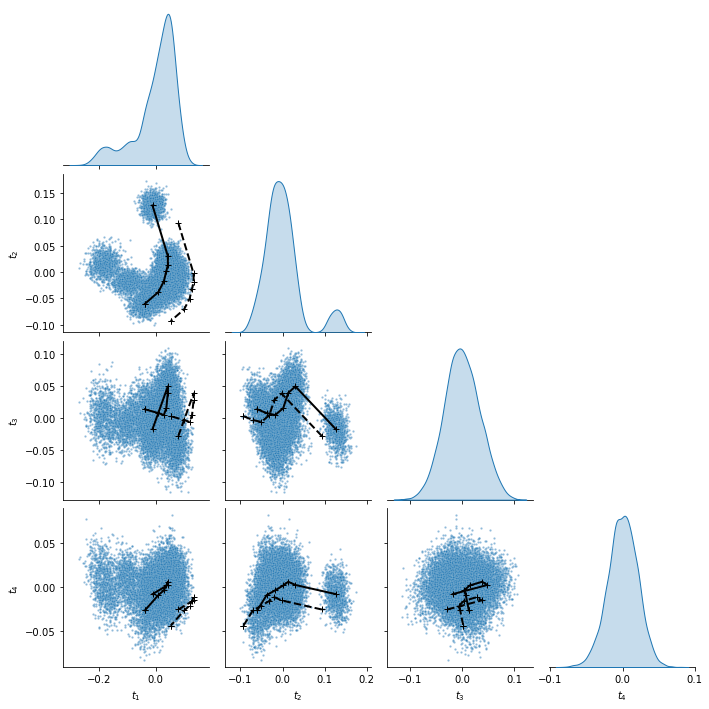

In [8]:
import sys
sys.path.insert(0, '../')
from plot_helpfunctions import scatterplot_with_blades

blade_pga = pga.gr_shapes2PGA(shapes_gr_bs)
blade_new_pga = pga.gr_shapes2PGA(new_blades[0])
scatterplot_with_blades(t, [blade_pga, blade_new_pga])

## Interpolate perturbed blade

Next, we apply affine deformations to scale airfoils in a physically meaningful way to define real cross-sections of the blade (similar to those we read from .yaml file). Additionally, we add hub circles back to the interpolation of the perturbed blade. 

In [9]:
# Inverse affine transform (just for one blade)
new_blade_phys = np.empty_like(new_blades[0])
for i, sh in enumerate(new_blades[0]):
    new_blade_phys[i] = sh @ M_bs[i] + b_bs[i]

# Add circles
new_blade_full = np.vstack((Blade.xy_landmarks[:2], new_blade_phys))

Then we generate blade interpolator based on Grassmann Interpolation class (see [Grassmannian Interpolation](https://g2aero.readthedocs.io/en/latest/how_to_guides/files/3_How_to_interpolate.html) for more details).

In [10]:
GrInterp = GrassmannInterpolator(Blade.eta_nominal, new_blade_full) 
eta_span = GrInterp.sample_eta(100, n_hub=10, n_tip=10, n_end=25)
_, blade_gr = GrInterp(eta_span, grassmann=True)
Transform = TransformBlade(Blade.M_yaml_interpolator, Blade.b_yaml_interpolator, 
                           Blade.pitch_axis, GrInterp.interpolator_M, GrInterp.interpolator_b)
xyz_local = Transform.grassmann_to_phys(blade_gr, eta_span)
xyz_global = global_blade_coordinates(xyz_local)

In [11]:
from plot_helpfunctions import plot_3d_blade

nominal_shapes = global_blade_coordinates(Transform.grassmann_to_phys(GrInterp.xy_grassmann, GrInterp.eta_nominal))
plot_3d_blade(xyz_global, nominal_shapes)